In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import cv2
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True

In [4]:
base_dir = 'D:/Project/Action/processed_dataset'
image_size = 224
batch_size = 32
num_epochs = 10
num_workers = 4
lr = 1e-4

In [5]:
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

In [6]:
train_dataset = datasets.ImageFolder(os.path.join(base_dir, 'train'), transform=transform)
val_dataset   = datasets.ImageFolder(os.path.join(base_dir, 'val'),   transform=transform)
test_dataset  = datasets.ImageFolder(os.path.join(base_dir, 'test'),  transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True,  num_workers=num_workers)
val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader  = DataLoader(test_dataset,  batch_size=batch_size, shuffle=False, num_workers=num_workers)

In [7]:
model = models.resnet50(weights='DEFAULT')
model.fc = nn.Linear(model.fc.in_features, len(train_dataset.classes))
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

In [8]:
train_losses, val_losses   = [], []
val_accuracies, lr_history = [], []

for epoch in range(num_epochs):
    # ───────── Train ─────────
    model.train()
    running_loss = 0.0
    n_train_batches = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        n_train_batches += 1

    scheduler.step() 
    lr_history.append(optimizer.param_groups[0]['lr'])

    avg_train_loss = running_loss / n_train_batches
    train_losses.append(avg_train_loss)

    # ───────── Validation ─────────
    model.eval()
    val_running_loss = 0.0
    n_val_batches    = 0
    correct, total   = 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            n_val_batches += 1

            _, predicted = torch.max(outputs, 1)
            total   += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_running_loss / n_val_batches
    val_losses.append(avg_val_loss)

    val_acc = 100 * correct / total
    val_accuracies.append(val_acc)

    # ───────── Epoch Log ─────────
    print(f"Epoch [{epoch+1}/{num_epochs}]  "
          f"TrainLoss {avg_train_loss:.4f} | ValLoss {avg_val_loss:.4f} | "
          f"ValAcc {val_acc:.2f}% | LR {lr_history[-1]:.6f}")


Epoch [1/10]  TrainLoss 1.2545 | ValLoss 0.5148 | ValAcc 87.01% | LR 0.000100
Epoch [2/10]  TrainLoss 0.1941 | ValLoss 0.2498 | ValAcc 93.03% | LR 0.000100
Epoch [3/10]  TrainLoss 0.0395 | ValLoss 0.2007 | ValAcc 94.23% | LR 0.000050
Epoch [4/10]  TrainLoss 0.0123 | ValLoss 0.1854 | ValAcc 94.48% | LR 0.000050
Epoch [5/10]  TrainLoss 0.0072 | ValLoss 0.1810 | ValAcc 95.11% | LR 0.000050
Epoch [6/10]  TrainLoss 0.0054 | ValLoss 0.1848 | ValAcc 94.99% | LR 0.000025
Epoch [7/10]  TrainLoss 0.0034 | ValLoss 0.1874 | ValAcc 95.05% | LR 0.000025
Epoch [8/10]  TrainLoss 0.0027 | ValLoss 0.1820 | ValAcc 95.24% | LR 0.000025
Epoch [9/10]  TrainLoss 0.0024 | ValLoss 0.1849 | ValAcc 94.96% | LR 0.000013
Epoch [10/10]  TrainLoss 0.0022 | ValLoss 0.1908 | ValAcc 94.89% | LR 0.000013


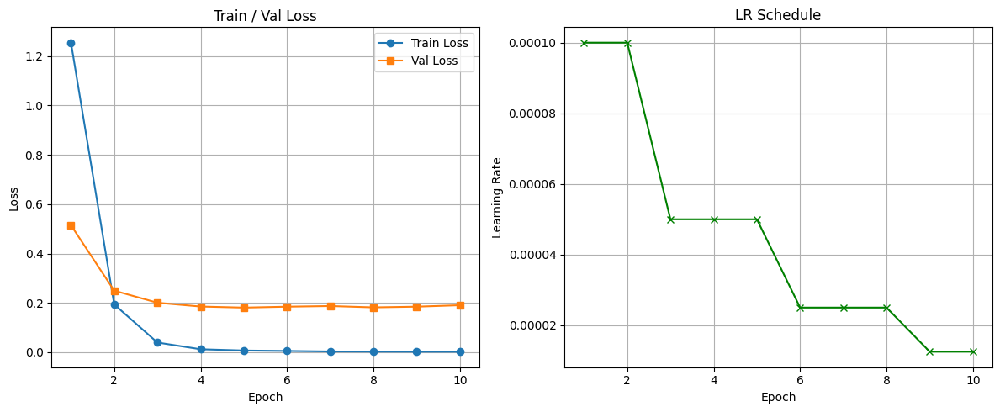

In [9]:
epochs = range(1, len(train_losses) + 1)
plt.figure(figsize=(12,5))

# Loss
plt.subplot(1,2,1)
plt.plot(epochs, train_losses, marker='o', label='Train Loss')
plt.plot(epochs, val_losses,   marker='s', label='Val Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title('Train / Val Loss')
plt.legend(); plt.grid(True)

# Learning-rate
plt.subplot(1,2,2)
plt.plot(epochs, lr_history, marker='x', color='green')
plt.xlabel('Epoch'); plt.ylabel('Learning Rate'); plt.title('LR Schedule')
plt.grid(True)

plt.tight_layout(); plt.show()


In [10]:
model.eval()
correct, total = 0, 0
y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_true.extend(labels.cpu().tolist())
        y_pred.extend(predicted.cpu().tolist())

test_acc = 100 * correct / total
print(f"\nTest Accuracy: {test_acc:.2f}%")


Test Accuracy: 95.56%


In [15]:
from sklearn.metrics import f1_score

f1_micro = f1_score(all_labels, all_preds, average='micro')
print(f"F1 Score (Micro):    {f1_micro:.4f}")

F1 Score (Micro):    0.9556


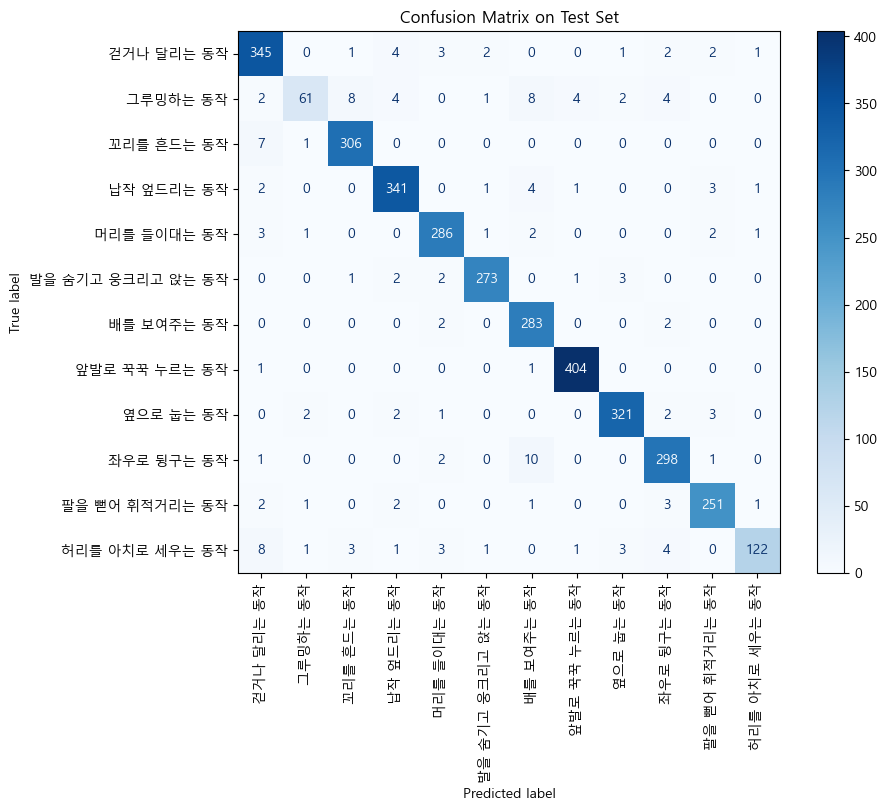

In [11]:
# Confusion Matrix
from matplotlib import font_manager, rc

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

class_names = test_dataset.classes

font_path = "C:/Windows/Fonts/malgun.ttf"  # '맑은 고딕'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)
plt.rcParams['axes.unicode_minus'] = False

cm = confusion_matrix(all_labels, all_preds)

fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues', ax=ax, xticks_rotation=90)
plt.tight_layout()
plt.title("Confusion Matrix on Test Set")
plt.show()

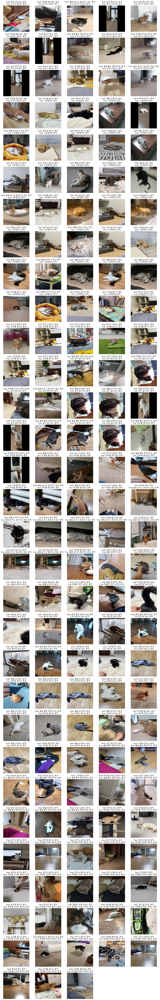

In [12]:
# 잘못 분류된 이미지 시각화
model.eval()
misclassified_images = []
misclassified_preds = []
misclassified_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        mismatches = predicted != labels
        if mismatches.any():
            for img, pred, label in zip(images[mismatches], predicted[mismatches], labels[mismatches]):
                misclassified_images.append(img.cpu())
                misclassified_preds.append(pred.item())
                misclassified_labels.append(label.item())

num_show = len(misclassified_images)
cols = 5
rows = (num_show + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
axes = axes.flatten()

for i in range(num_show):
    img = misclassified_images[i]
    img = img.permute(1, 2, 0) * 0.5 + 0.5
    pred = test_dataset.classes[misclassified_preds[i]]
    label = test_dataset.classes[misclassified_labels[i]]
    ax = axes[i]
    ax.imshow(img.numpy())
    ax.set_title(f"Pred: {pred}\nTrue: {label}")
    ax.axis('off')

for j in range(num_show, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

c:\Users\roux\miniconda3\envs\torch310\lib\site-packages\torch\nn\modules\module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


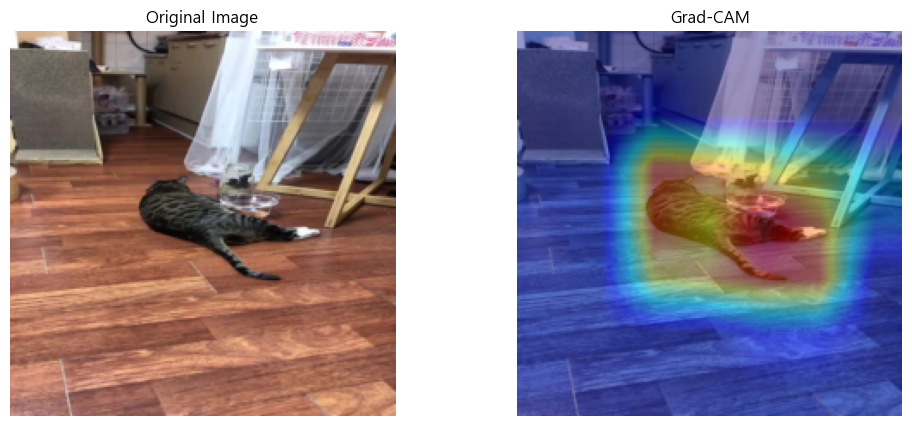

In [13]:
# Grad-CAM
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        input_tensor = input_tensor.unsqueeze(0).to(device)

        output = self.model(input_tensor)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        self.model.zero_grad()
        output[0, target_class].backward()

        pooled_gradients = self.gradients.mean(dim=[0, 2, 3])
        activations = self.activations[0]
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]
        heatmap = activations.mean(dim=0).cpu().numpy()
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        return heatmap

target_layer = model.layer4[1].conv2
grad_cam = GradCAM(model, target_layer)

sample_img, _ = test_dataset[0]
heatmap = grad_cam.generate(sample_img)

img = sample_img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
img = np.uint8(255 * img)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
superimposed = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(superimposed[..., ::-1])  # BGR to RGB
plt.title("Grad-CAM")
plt.axis('off')
plt.show()

In [14]:
# 저장
model_path = "D:/Project/Action/resnet50_cat_Action.pt"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to D:/Project/Action/resnet50_cat_Action.pt
